# GMNS/Network Wrangler 2.0 Workshop

***Placeholder text from workshop overview:*** *Building and maintaining transportation networks for travel models is often time-consuming and error-prone. This workshop introduces the General Modeling Network Specification (GMNS), a standardized, human- and machine-readable format developed by the Zephyr Foundation with support from FHWA. GMNS enables easier sharing of routable road network files across platforms and agencies.  Participants will also explore Network Wrangler 2.0, an open-source Python tool that simplifies network editing through “Project Cards” - standardized, human- and machine-readable text files that describe proposed changes to roadway, transit, pedestrian, or bicycle infrastructure. The tool automates network updates, supports scenario management, and facilitates collaboration across agencies and software platforms.  This hands-on workshop will guide participants through building GMNS- and Network Wrangler-ready travel model networks from scratch using open-source data. Attendees will learn how to create network scenarios with Network Wrangler and perform network analysis with GMNS standard networks, including transit accessibility evaluation. Live demonstrations will showcase how these tools streamline network development and scenario management for regional transportation planning.*  


## Workflow Overview:

1. **Download OSM network data** - Gets raw road network from OpenStreetMap
2. **Simplify network topology** - Consolidates intersections while preserving connectivity  
3. **Standardize attributes** - Processes highway types, lanes, and access modes
4. **Assign county numbering** - Creates model-specific node/link IDs by county
5. **Integrate GTFS transit** - Loads and processes transit feed data
6. **Create transit stops/links** - Connects transit to the road network
7. **Output final files** - Writes complete network in multiple formats
8. **Map Downtown Network** - Creates subset network and interactive map 



In [1]:
import argparse
import datetime
import getpass
import pathlib
import pickle
import pprint
import statistics
from typing import Any, Optional, Tuple, Union

import networkx
import osmnx
import numpy as np
import pandas as pd
import geopandas as gpd

import tableau_utils
import network_wrangler
from network_wrangler import WranglerLogger
from network_wrangler.params import LAT_LON_CRS
from network_wrangler.roadway.io import load_roadway_from_dataframes, write_roadway
from network_wrangler.transit.io import load_feed_from_path, write_transit, load_transit
from network_wrangler.models.gtfs.types import RouteType
from network_wrangler.utils.transit import \
  drop_transit_agency, filter_transit_by_boundary, create_feed_from_gtfs_model, truncate_route_at_stop

from constants import *
from visualization import *
import seaborn as sns

# Import the 7-step workflow functions
from create_mtc_network_from_OSM_refactor import (
    step1_download_osm_network,
    step2_simplify_network_topology, 
    step3_standardize_attributes,
    step4_assign_county_node_link_numbering,
    step5_integrate_gtfs_transit_data,
    step6_create_transit_stops_and_links,
    step7_output_final_network_files
)



## Step 1: Download OSM network data
Gets raw road network from OpenStreetMap

In [2]:
# Download the OSM network data for San Francisco county
osm_nw = step1_download_osm_network(county="San Francisco")

======= STEP 1: Download OSM network for San Francisco =======
Loaded cached OSM graph from data\processed\0_graph_OSM_SanFrancisco.pkl
Graph has 169,335 edges and 57,674 nodes


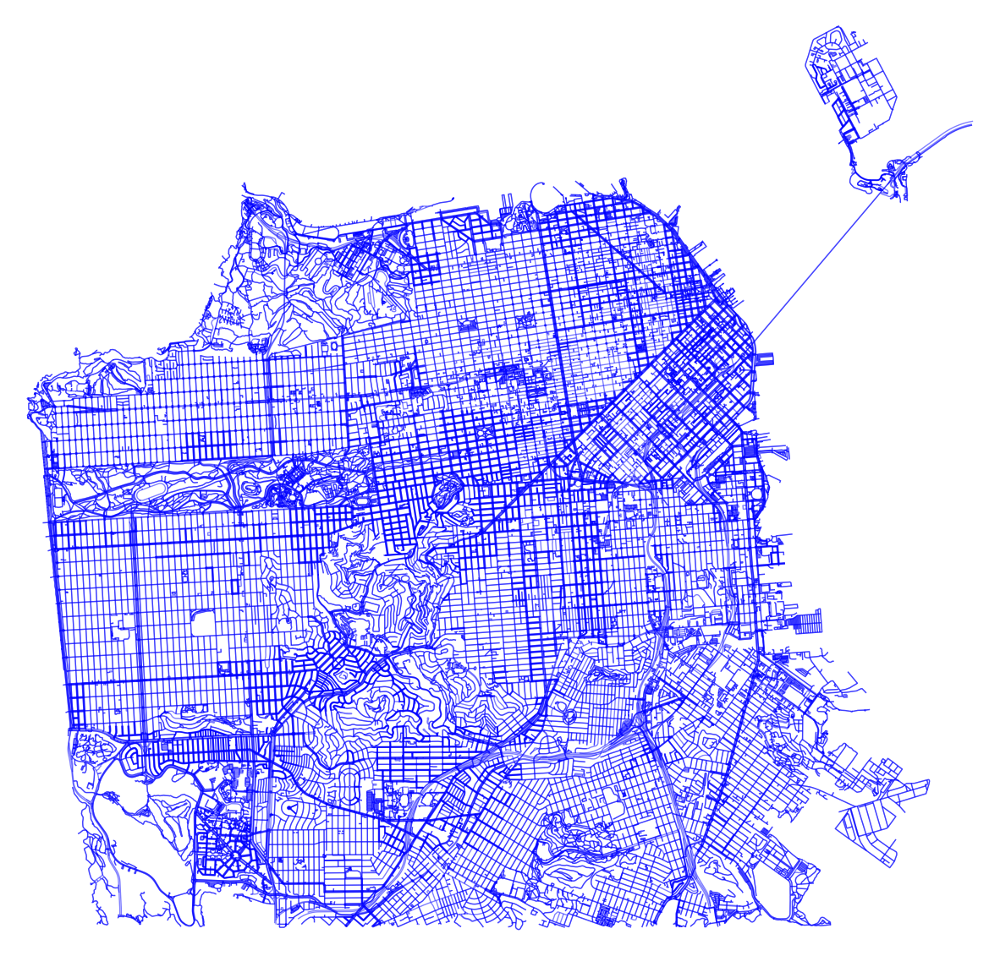

In [ ]:
# Visualize the network
fig, ax = create_osmnx_plot(osm_nw)

## Step 2: Simplify network topology  
Consolidates intersections while preserving connectivity

In [4]:
simplified_osm_nw = step2_simplify_network_topology(osm_nw, county="San Francisco")

======= STEP 2: Simplify network topology for San Francisco =======
Loaded cached simplified graph from data\processed\1_graph_OSM_SanFrancisco_simplified20.pkl
Simplified graph has 91,669 edges and 25,662 nodes


In [5]:
compare_original_and_simplified_networks(osm_nw, simplified_osm_nw)

=== Network Comparison: Original OSM vs Simplified OSM ===

📊 BASIC STATISTICS
Nodes: 57,674 → 25,662 (44.5% remaining)
Edges: 169,335 → 91,669 (54.1% remaining)
Nodes removed: 32,012 (55.5%)
Edges removed: 77,666 (45.9%)

🔗 CONNECTIVITY ANALYSIS
Average degree: 5.87 → 7.14
Max degree: 16 → 46

Degree 2 nodes (typical street continuation): 6,502 → 4,000
Degree 3 nodes (T-intersections): 1,543 → 839
Degree 4+ nodes (complex intersections): 49,547 → 20,795

📏 EDGE LENGTH ANALYSIS
Average edge length: 42.8m → 209.4m
Total network length: 7253.1km → 19199.2km
Shortest edge: 0.0m → 12.2m
Longest edge: 3697.1m → 12131.6m


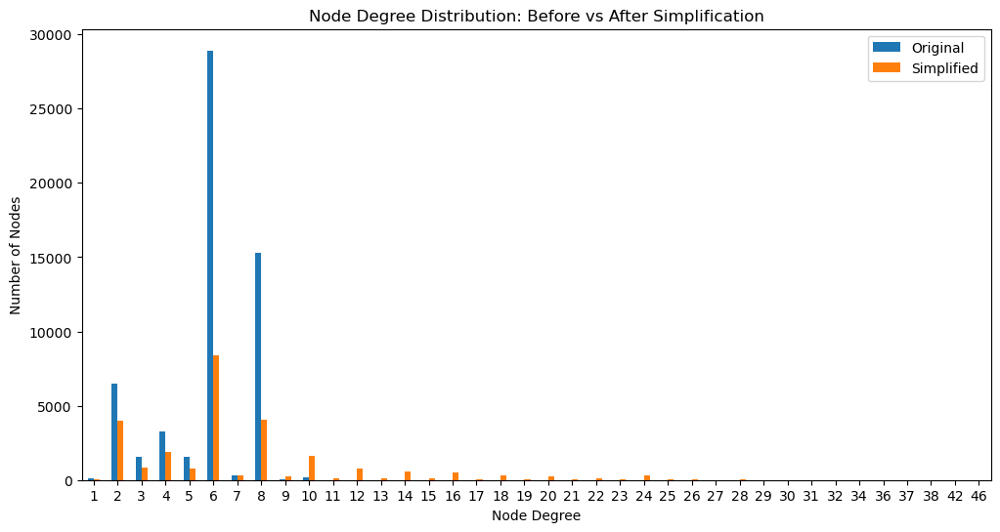

In [ ]:
# Plot node degree changes original vs simplified 
plot_node_degree_changes(osm_nw, simplified_osm_nw)

## Step 3: Standardize attributes  
Processes highway types, lanes, and access modes

In [7]:
links_gdf, nodes_gdf = step3_standardize_attributes(simplified_osm_nw, county="San Francisco")

======= STEP 3: Standardize attributes for San Francisco =======
Standardized network: 64,635 links, 25,662 nodes


In [ ]:
print("🔗 LINKS GEODATAFRAME")
print(f"Shape: {links_gdf.shape}")
print(f"Columns: {list(links_gdf.columns)}")
print("\nFirst few rows:")
print(links_gdf.head())

print("\n🎯 NODES GEODATAFRAME") 
print(f"Shape: {nodes_gdf.shape}")
print(f"Columns: {list(nodes_gdf.columns)}")
print("\nFirst few rows:")
print(nodes_gdf.head())

🔗 LINKS GEODATAFRAME
Shape: (64635, 42)
Columns: ['A', 'B', 'key', 'osm_link_id', 'highway', 'oneway', 'reversed', 'length', 'geometry', 'u_original', 'v_original', 'lanes_orig', 'maxspeed', 'name', 'ref', 'bridge', 'tunnel', 'access', 'service', 'width', 'junction', 'area', 'dupe_A_B', 'county', 'model_link_id', 'shape_id', 'highway_orig', 'drive_access', 'bike_access', 'walk_access', 'truck_access', 'bus_access', 'steps', 'lanes:forward', 'lanes:backward', 'lanes:both_ways', 'lanes:bus', 'lanes:bus:forward', 'lanes:bus:backward', 'lanes', 'buslanes', 'distance']
Index: None

First few rows:
         A        B  key osm_link_id  highway oneway reversed      length  \
0  1000000  1000001    0    32399102  footway  False    False   89.336241   
1  1000000  1000002    0    32399102  footway  False     True  842.925442   
2  1000001  1019950    0  1286140892  footway  False    False   26.620619   
3  1000001  1019951    0  1286140892  footway  False     True   25.715799   
4  1000002  101

## Step 4: Assign county numbering  
Creates model-specific node/link IDs by county

In [10]:
roadway_nw = step4_assign_county_node_link_numbering(links_gdf, nodes_gdf, county="San Francisco")

======= STEP 4: Create roadway network with county numbering for San Francisco =======
Loaded cached roadway network from 4_roadway_network_SanFrancisco


## Step 5: Integrate GTFS transit
Loads and processes transit feed data 

In [11]:
gtfs_model = step5_integrate_gtfs_transit_data(county="San Francisco")
gtfs_model

======= STEP 5: Integrate GTFS transit data for San Francisco =======
Loaded cached GTFS model from data\processed\4_gtfs_model_SanFrancisco


GtfsModel:
  Agencies (3): San Francisco Municipal Transportation Agency, Caltrain, Bay Area Rapid Transit
  Tables: 81 routes, 10488 trips, 3420 stops, 376610 stop_times, 315 shapes (81298 points)
  Types: agency: DataFrame, routes: DataFrame, trips: DataFrame, stops: DataFrame, stop_times: DataFrame, shapes: DataFrame
  Route types: Tram:7, Metro:8, Rail:5, Bus:58, Ferry:0, Cable:3, Gondola:0, Funicular:0, Type11:0, Type12:0

## Step 6: Create transit stops/links  
Connects transit to the road network

In [12]:
transit_feed_object_w_stops_links = step6_create_transit_stops_and_links(gtfs_model, roadway_nw, county="San Francisco")
transit_feed_object_w_stops_links

======= STEP 6: Create transit stops and links for San Francisco =======
Created transit feed with stops and links integrated


Feed (Wrangler GTFS):
  Tables: 81 routes, 315 trips, 2384 stops, 9155 stop_times, 315 shapes (35843 points), 892 frequencies
  Types: routes: DataFrame, trips: DataFrame, stops: DataFrame, stop_times: GeoDataFrame, shapes: GeoDataFrame, frequencies: DataFrame
  Route types: Tram:7, Metro:8, Rail:5, Bus:58, Ferry:0, Cable:3, Gondola:0, Funicular:0, Type11:0, Type12:0
  Model nodes: 2384 unique nodes referenced

## Step 7: Output final files  
Writes complete network in multiple formats

In [13]:
step7_output_final_network_files(roadway_nw, transit_feed_object_w_stops_links, county="San Francisco")

ML_access column not found in roadway network
======= STEP 7: Output final network files for San Francisco =======
Wrote roadway network with transit in parquet format
Wrote roadway network with transit in geojson format
Wrote transit feed to data\processed\6_feed_SanFrancisco
Created final transit network with 81 routes


## Step 8: Map Downtown Network  
Creates subset network and interactive map

In [4]:
nw_gdf = gpd.read_parquet("data/processed/5_roadway_network_inc_transit_SanFrancisco_link.parquet")

In [5]:
import warnings
warnings.filterwarnings("ignore")

create_downtown_network_map(nw_gdf)

Original network: 65,010 links
Subset network: 8,581 links


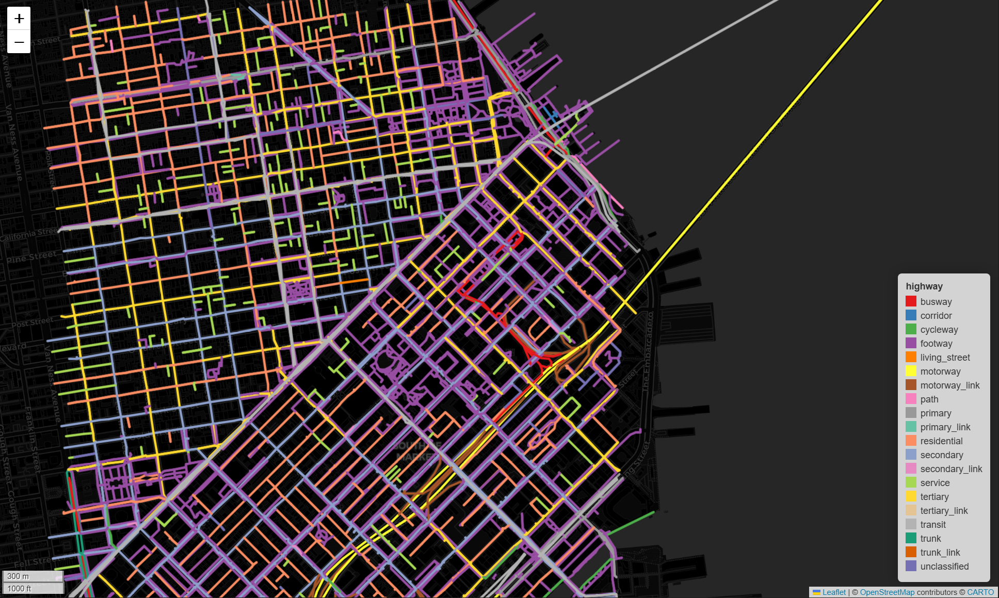